# **APS 1 - IA para Automação**
## **Classificador de Falhas em Acionamento de Máquinas Rotativas**
### _Trabalho feito por Bruno Olivares, Gustavo e Lucas Gomes_

#### **1. Panorama do Projeto**

#### **2. Exploração dos Dados**

Como mencionado, para a elaboração do classificador em questão, nos foi fornecido um dataset com diversos dados coletados referente a todas as categorias abordadas pelo problema. Antes de realmente elaborar os algoritmos, é necessário entender com que dados que se está trabalhando e que informações que são possíveis de extrair delas antes de reaizar qualquer progresso, e é essa etapa que será abordada nesse tópico. 

Antes de realizar quaisquer operações, primeiro é necessário importar algumas bibliotecas que serão utilizadas não só nessa etapa, mas durante toda a elaboração do projeto:

In [2]:
# Bibliotecas utilizadas no decorrer do projeto

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

Atualmente, o dataset está na forma de csv (Comma Separated Values). De forma que possamos processar as informações de forma adequada via Python, primeiro será transformada o arquivo .csv em um dataframe que pode então ser melhor e visualizado:

In [3]:
# Leitura e Exibição do Dataset

df_maquinas = pd.read_csv("Dataset APS1_Sinais Eletricos e Vibracao_csv.xls")
df_maquinas

,tempo_s,tipo_setup,I_entrada_A,P_entrada_W,I_saida_A,DesvPad_I_entrada_A,DesvPad _P_entrada_W,DesvPad _I_saida_A,Amp_I_entrada_A,Amp_P_entrada_W,Amp_I_saida_A,Kurtosis_I_entrada_A,Kurtosis_P_entrada_W,Kurtosis_I_saida_A,Mag_S1_f1_dBrms,Mag_S1_f2_dBrms,Mag_S1_f3_dBrms,Mag_S2_f1_dBrms,Mag_S2_f2_dBrms,Mag_S2_f3_dBrms
0,0.00,0.0,0.44905,63.67320,1.43660,0.042740,21.869566,0.113479,0.175,91.738,0.406,12.474475,15.435837,4.223108,-50.647991,-63.189443,-47.864704,-59.629807,-73.010381,-49.583755
1,0.08,0.0,0.44610,69.40320,1.67860,0.048945,1.600020,0.854342,0.227,7.359,3.843,20.070610,13.335535,16.966677,-50.696943,-63.340003,-48.313132,-59.591150,-72.360239,-49.473893
2,0.16,0.0,0.45175,69.11385,1.39950,0.042337,5.220348,0.284000,0.207,24.185,1.395,19.087723,7.345771,11.032327,-47.724322,-62.837371,-48.384219,-55.194912,-63.127903,-48.083630
3,0.24,0.0,0.43510,68.85665,1.39705,0.063224,3.437546,0.219507,0.228,16.040,0.973,6.869051,19.849528,9.136137,-47.652608,-62.613368,-48.768793,-55.275822,-63.310116,-47.937933
4,0.32,0.0,0.45055,70.52860,1.43375,0.048497,1.240032,0.111967,0.222,4.394,0.425,20.205840,2.325535,2.818658,-47.019446,-61.314274,-49.016646,-54.665312,-60.825200,-47.886619
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2500,39.68,4.0,0.46575,68.42795,1.59235,0.042147,8.058820,0.900427,0.199,37.403,4.276,5.486469,22.266532,21.582764,-33.195195,-52.502279,-41.610532,-37.874381,-49.147213,-42.417970
2501,39.76,4.0,0.44705,62.32815,1.57365,0.068987,15.876663,0.904702,0.231,62.159,4.218,5.237910,11.518238,21.593782,-33.360763,-52.868492,-42.054637,-37.995903,-49.251871,-42.703237
2502,39.84,4.0,0.47110,76.04075,1.77275,0.045194,34.799709,1.657858,0.191,184.906,7.810,9.874863,20.660427,6.075266,-33.497896,-53.300911,-42.289221,-38.129107,-48.947030,-42.896321
2503,39.92,4.0,0.47745,72.86850,1.39700,0.043033,0.826486,0.131019,0.194,2.893,0.383,21.320253,2.327027,1.904577,-33.581380,-53.601503,-42.527074,-38.258422,-48.618126,-42.420583


Nessa configuração, nossa variável alvo é o "tipo_setup", o qual descreve se a condição operacional da máquina está normal (0), desacoplado (1), sobrecarregado (2), desbalanceado (3) ou desalinhado (4). De resto, temos informações referentes à corrente de entrada, corrente de saída do motor e potência de entrada (média, desvio padrão, amplitude e kurtosis) além da informação da frequência natural, primeira harmônica e segunda harmônica. 

Uma primeira exploração que se pode fazer é entender o comportamento estatístico de cada um dos parâmetros em todo o dataset (sendo necessário eliminar a variável tempo_s e tipo_setup visto que não são atributos a serem considerados). Para isso, é possível executar o seguinte comando:

In [4]:
# Estatísticas Descritivas Geral dos atributos do dataset de interesse

print("Estatísticas Descritivas Gerais")
df_maquinas.iloc[:, 2:].describe()

Estatísticas Descritivas Gerais


,I_entrada_A,P_entrada_W,I_saida_A,DesvPad_I_entrada_A,DesvPad _P_entrada_W,DesvPad _I_saida_A,Amp_I_entrada_A,Amp_P_entrada_W,Amp_I_saida_A,Kurtosis_I_entrada_A,Kurtosis_P_entrada_W,Kurtosis_I_saida_A,Mag_S1_f1_dBrms,Mag_S1_f2_dBrms,Mag_S1_f3_dBrms,Mag_S2_f1_dBrms,Mag_S2_f2_dBrms,Mag_S2_f3_dBrms
count,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000
mean,0.467173,71.095485,1.510273,0.062549,10.030840,0.495564,0.280475,46.371912,2.225988,12.050777,14.937885,11.168255,-39.983011,-54.772230,-47.535366,-45.145129,-55.583079,-46.578764
std,0.037798,6.369966,0.138248,0.057536,11.105669,0.375317,0.269268,52.036291,1.767510,5.230828,6.931692,7.207961,4.949400,9.313107,5.857693,6.269441,9.072283,3.855181
min,0.261900,38.470250,0.810650,0.001372,0.543396,0.063909,0.005000,1.893000,0.244000,1.660392,1.325033,1.187931,-50.696943,-71.520216,-58.985078,-65.271484,-73.010381,-54.985263
25%,0.445700,67.307950,1.419950,0.041017,2.689081,0.154070,0.183000,12.789000,0.596000,7.971048,9.554414,4.030760,-43.902336,-59.541521,-52.053099,-50.245276,-63.067057,-49.493122
50%,0.456750,69.612150,1.479250,0.056569,8.407893,0.377251,0.244000,38.618000,1.745000,10.701860,16.355427,9.754281,-41.943547,-54.967319,-47.868026,-48.353184,-59.158229,-47.233461
75%,0.472450,73.029150,1.590750,0.070714,12.983316,0.879553,0.302000,58.301000,4.108000,15.927991,21.599938,18.540216,-34.647596,-50.619857,-41.947513,-37.978948,-49.267334,-42.830915
max,0.625950,96.651550,2.118200,0.860274,149.491667,2.007972,3.881000,672.213000,10.687000,22.979158,22.994930,22.794465,-31.993773,-37.605394,-36.684861,-35.173001,-37.765710,-38.495491


Para melhor visualização dessas estatísticas, não só podemos elaborar gráficos de barra quanto podemos elaborar boxplots para cada parametro de forma a analizar os percentis, assim como visto nas células subsequentes:

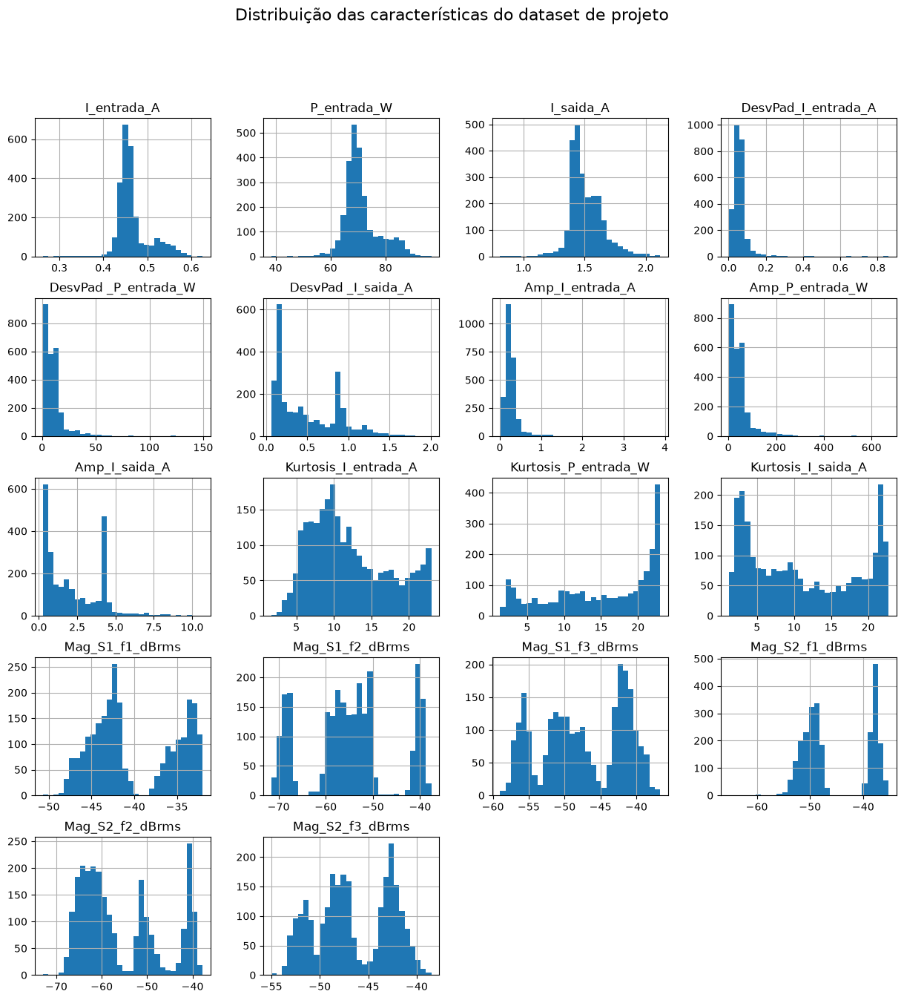

In [5]:
# Gráfico de Barra para visualizar a distribuição de atributos

df_maquinas.iloc[:, 2:].hist(figsize=(15, 15), bins = 30)
plt.suptitle('Distribuição das características do dataset de projeto', fontsize=16)
plt.show()

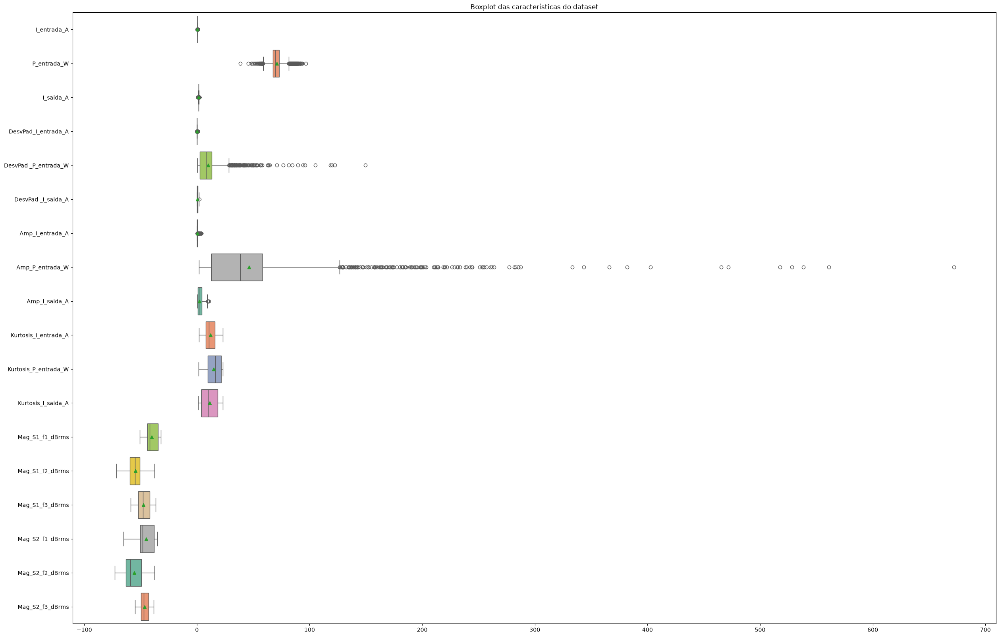

In [9]:
# Conjunto de boxplots de cada um dos parâmetros

plt.figure(figsize=(30, 20))
sns.boxplot(data=df_maquinas.iloc[:, 2:], showmeans=True, orient='h', palette='Set2')
plt.title('Boxplot das características do dataset')
plt.show()

**Com esses dois gráficos, já é possível realizar algumas observações interessantes:**

**1.** Fora os valores de Média de Corrente, Média de Potência de Entrada e Média de Corrente de Entrada, todos os outros parâmetros não demonstram um perfil normal de distribuição, onde se vê parâmetros com perfis de cauda tanto a direita quanto a esquerda além de gráficos com mais de um pico;

**2.** No boxplot, fica evidente que nos parâmetros de Potência de Entrada, Desvio Padrão de Potência de Entrada, Amplitude de Potência de Entrada e Amplitude de Corrente de Entrada possuem um número alto de outliers, o que pode significar que, caso usados para elaboração do classificador, podem vir a gerar um overfitting do modelo;

Como parte dessa etapa, também é ideal verificar se todas as casses estão balanceadas, isso é, que todas as classes tenham a mesma quantidade de ocorrências. Para verificar isso, pode-se implementar o seguinte código: 

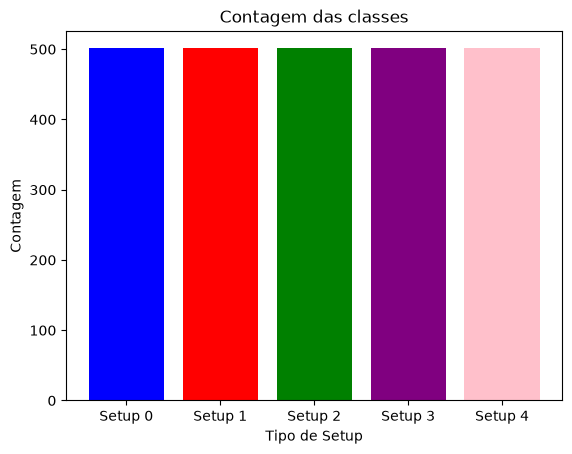

In [31]:
# Contagem das ocorrências de classes

contagem = df_maquinas["tipo_setup"].value_counts()

plt.bar(["Setup 0", "Setup 1", "Setup 2", "Setup 3", "Setup 4"], [contagem[0], contagem[1], contagem[2], contagem[3], contagem[4]], color = ["blue", "red", "green", "purple", "pink"])
plt.title("Contagem das classes")
plt.xlabel("Tipo de Setup")
plt.ylabel("Contagem")
plt.show()

Neste caso, é possível ver que o dataset já possui a quantidade de ocorrências de cada classe balanceada desde o começo, não sendo necessário realizar quaisquer operações nessa frente.

Como a elaboração de um algoritmo de classificação baseia-se nas leituras das relações entre os atributos e a variável alvo, podemos iniciar a visualizar essas relações através tanto de uma matriz de confusão quanto de um gráfico de pares, os quais podem ambos ser visualizados nas células a seguir:

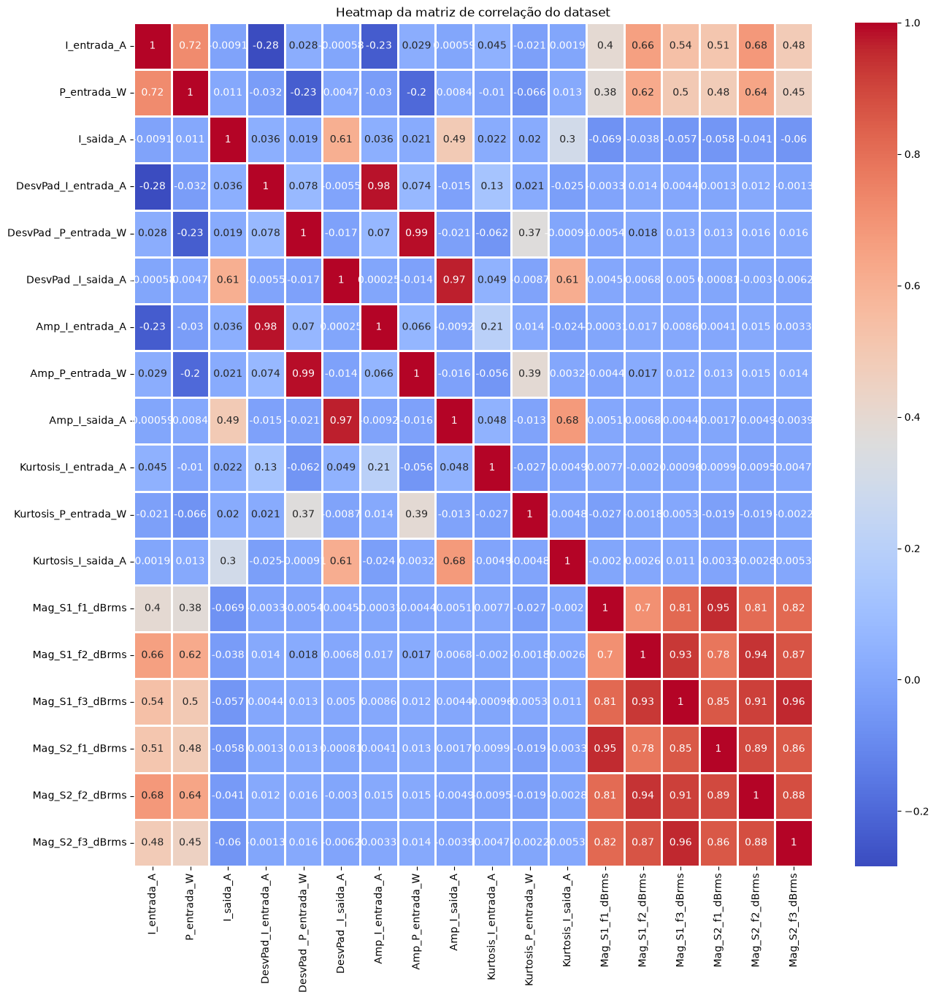

In [35]:
# Elaboração da Matriz de Confusão

correlation_matrix = df_maquinas.iloc[:, 2:].corr()

plt.figure(figsize=(15, 15))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=1)
plt.title('Heatmap da matriz de correlação do dataset')
plt.show()

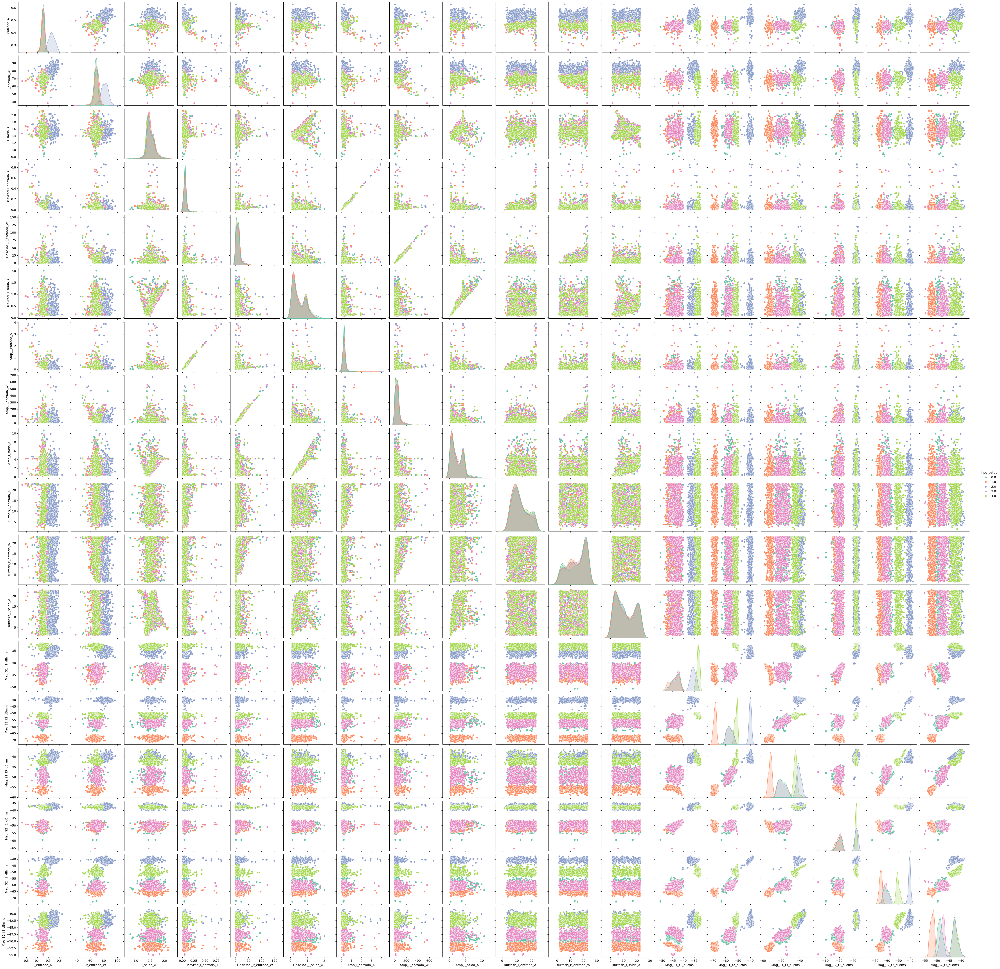

In [11]:
# Elaboração do Gráfico de Pares

sns.pairplot(df_maquinas.drop(columns = "tempo_s"), hue='tipo_setup', palette='Set2')
plt.show()

Além dos gráficos previamente exibidos, podemos também realizar boxplots de cada um dos atributos para cada uma das classes de forma a visualizar de um outro ângulo como que cada atributo "divide" as classes de interesse. Essa etapa pode ser vista na seguinte célula:

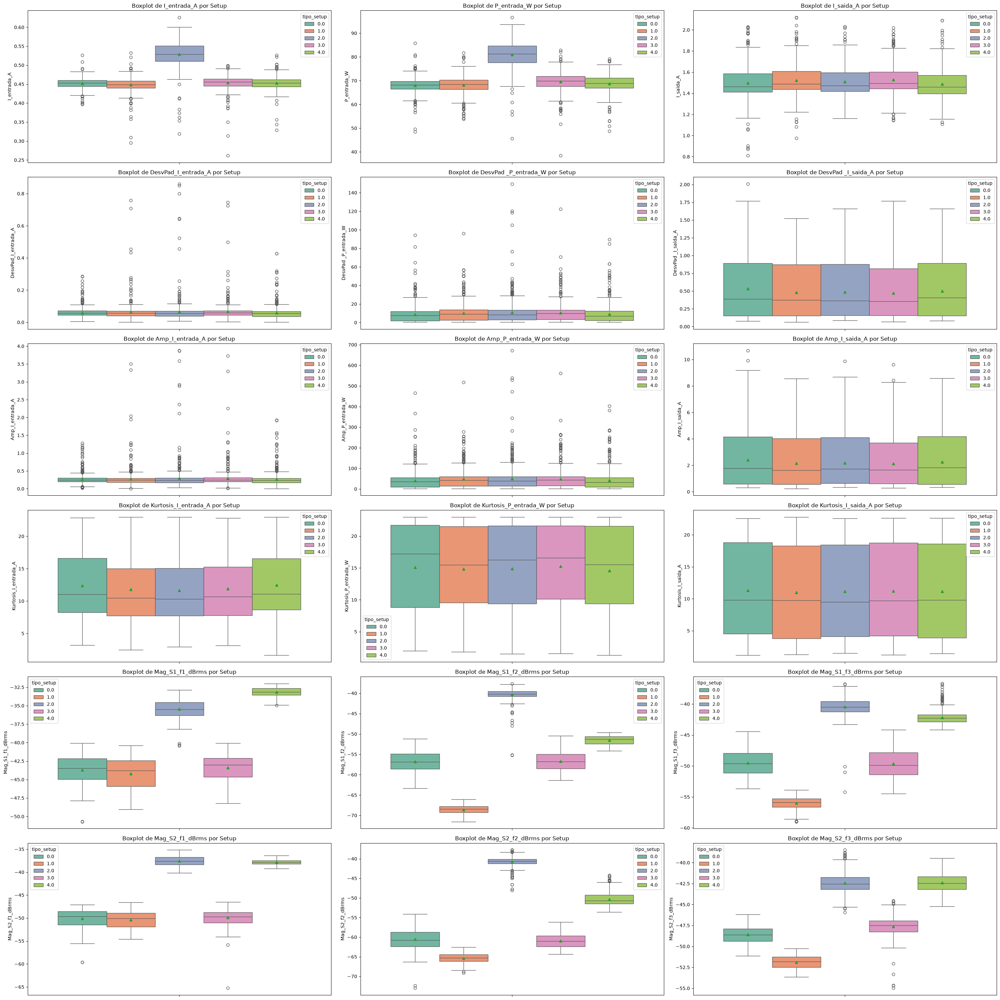

In [29]:
plt.figure(figsize=(30, 30))

for i, column in enumerate(df_maquinas.drop(columns=["tempo_s", "tipo_setup"]).columns):
    plt.subplot(6, 3, i+1)
    sns.boxplot(hue="tipo_setup", y=column, data=df_maquinas, showmeans=True, palette='Set2')
    plt.title(f'Boxplot de {column} por Setup')
plt.tight_layout()
plt.show()

**A partir dos gráficos previamente observados, algumas observações podem ser feitas:**

**1.** Na Matriz de Confusão, é possível ver que existe uma forte correlação entre as frequências naturais de ambos os sensores assim como suas harmônicas, o que pode indicar que pode ser possível utilizar apenas de um dos parâmetros para a elaboração do modelo classificador. Ainda nesse mesmo gráfico, é possível ver que a Amplitude de Corrente de Entrada, Amplitude Potência de Entrada e Amplitude de Corrente de Entrada estão fortemente correlacionados com os respectivos desvios padrões;

**2.** No gráfico de pares, fica evidente que os dados de frequência natural e harmônicas dos sensores tornal visível uma possível separação das classes de interesse, o que já não é muito visível nos outros (com exceção da kurtosis de corrente de entrada e potência de entrada onde, quando comparada com os respectivos parâmetros de corrente de entrada e potência de entrada, é possível ver uma leve separação, especialmente do setup 2);

**3.** Nos boxplots de cada atributo comparado as classes, é possível ver uma separação do setup 2 se utilizando do parâmetro de média de corrente de entrada e potência de entrada, porém, é necessário se atentar com a presença de uma quantidade considerável de outliers. Por outro lado, a frequência natural tanto do sensor 1 quanto do 2 permitem uma separação dos setups 2 e 4 dos outros com quase nenhum outlier presente. A segunda harmônica do sensor 2 consegue fazer uma divisão até um pouco melhor entre os setups 2 e 4, mas existem vários outliers especialmente nesse parâmetro e nesses setups;

Para explorar a distribuição das medidas, podemos também elaborar um gráfico radar, assim como é visto na célula a seguir:

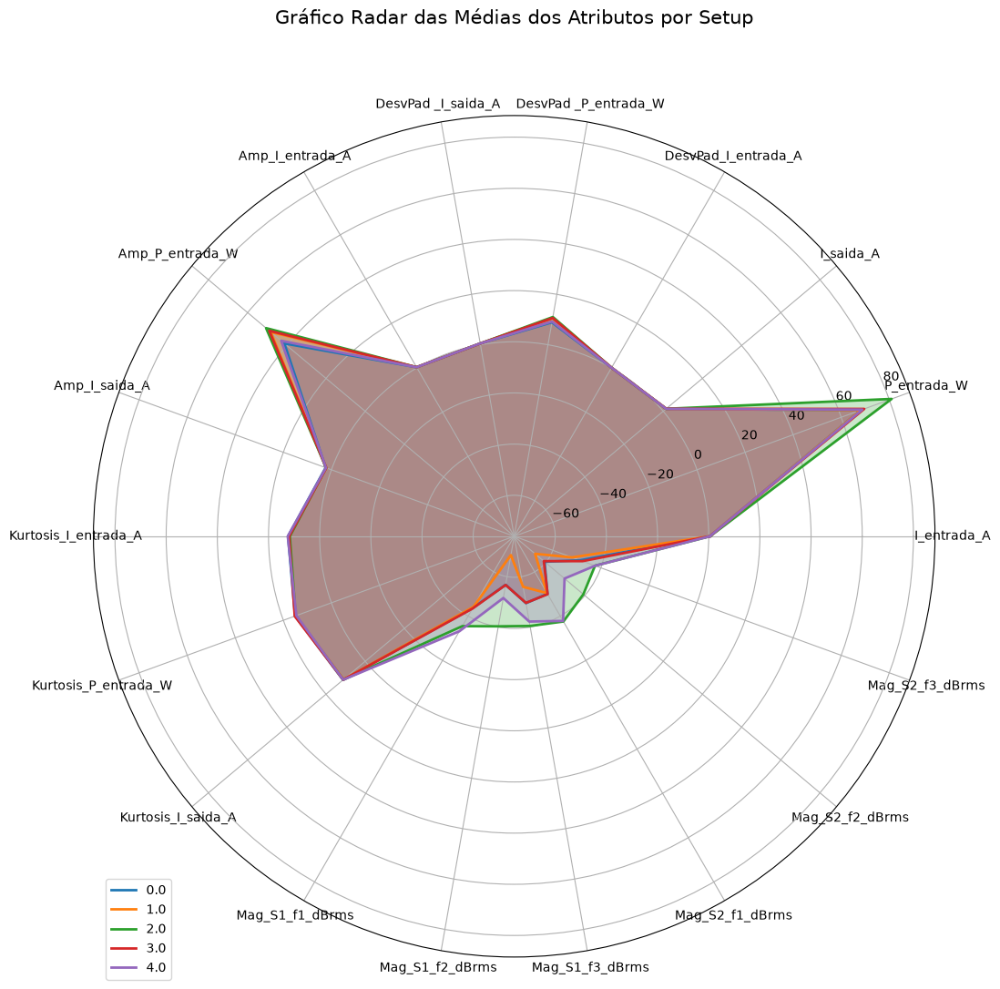

In [32]:
# 6. Gráfico Radar

# Importando bibliotecas adicionais para o gráfico radar
from math import pi

# Normalizando as médias para plotar no gráfico radar
df_means = df_maquinas.drop(columns=["tempo_s"]).groupby('tipo_setup').mean()

# Função para criar o gráfico radar

def plot_radar(df, title):

    # Número de variáveis
    categories = list(df.columns)
    N = len(categories)

    # Ângulo para cada eixo no gráfico radar
    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]

    # Inicializando o gráfico
    fig, ax = plt.subplots(figsize=(12, 12), subplot_kw=dict(polar=True))

    # Loop através de cada espécie
    for index, row in df.iterrows():
        values = row.tolist()
        values += values[:1]
        ax.plot(angles, values, linewidth=2, linestyle='solid', label=index)
        ax.fill(angles, values, alpha=0.25)

    # Adicionando os rótulos e título
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(categories)
    ax.set_title(title, size=15, color='black', y=1.1)

    # Exibindo a legenda
    plt.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1))
    plt.show()

# Chamando a função para plotar o gráfico radar
plot_radar(df_means, "Gráfico Radar das Médias dos Atributos por Setup")

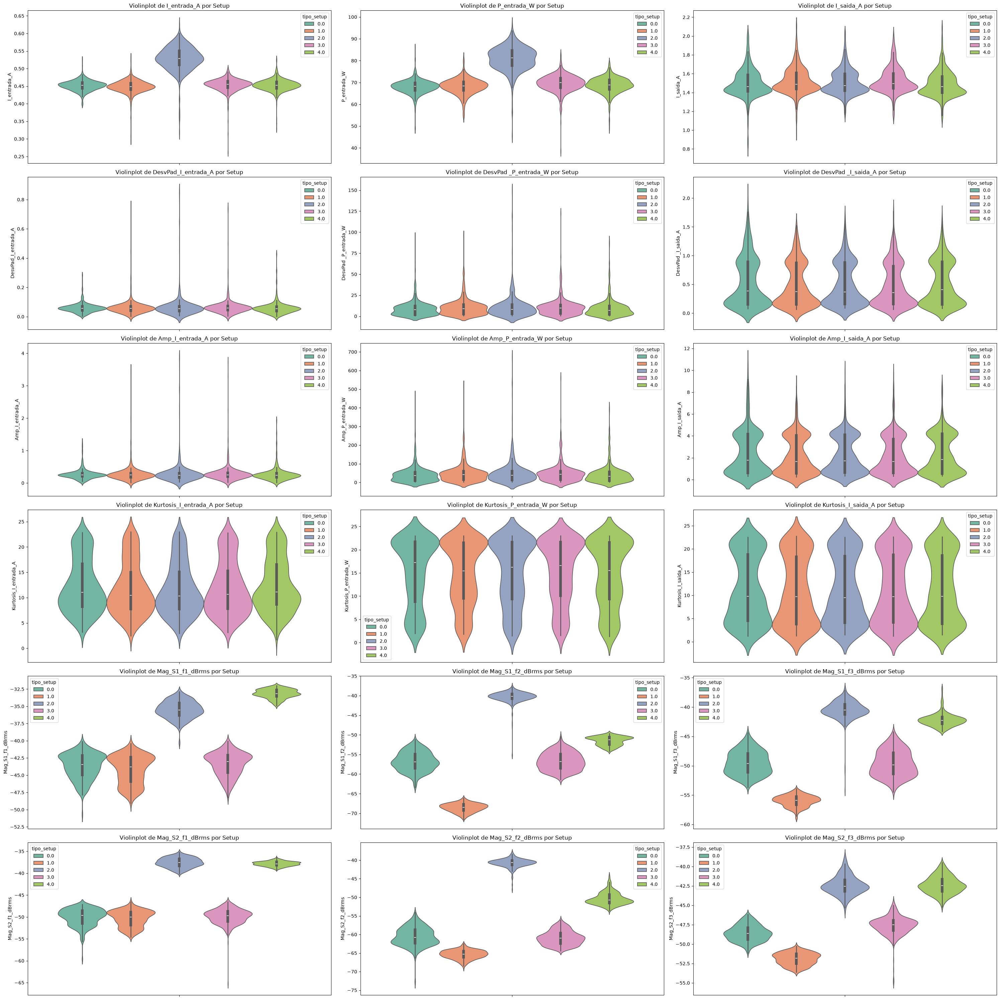

In [36]:
# Elaboração do Violinplot (é necessário?)

plt.figure(figsize=(30, 30))

for i, column in enumerate(df_maquinas.drop(columns=["tempo_s", "tipo_setup"]).columns):
    plt.subplot(6, 3, i+1)
    sns.violinplot(hue="tipo_setup", y=column, data=df_maquinas, palette='Set2')
    plt.title(f'Violinplot de {column} por Setup')
plt.tight_layout()
plt.show()

#### **3. Pré Processamento dos Dados**

##### **4.1. KNN Classifier**

##### **4.2. Decision Tree**

##### **4.3. SVM**